In [1]:
# import packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime


In [2]:
df = pd.read_csv('train_data.csv',index_col=0)

## EDA

In [3]:
df.shape

(56389, 29)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56389 entries, 0 to 74110
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      56389 non-null  int64  
 1   log_price               56389 non-null  float64
 2   property_type           56389 non-null  object 
 3   room_type               56389 non-null  object 
 4   amenities               56389 non-null  object 
 5   accommodates            56389 non-null  int64  
 6   bathrooms               56231 non-null  float64
 7   bed_type                56389 non-null  object 
 8   cancellation_policy     56389 non-null  object 
 9   cleaning_fee            56389 non-null  bool   
 10  city                    56389 non-null  object 
 11  description             56389 non-null  object 
 12  first_review            56388 non-null  object 
 13  host_has_profile_pic    56249 non-null  object 
 14  host_identity_verified  56249 non-null

### Visualize raw data

D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='review_scores_rating', ylabel='Density'>

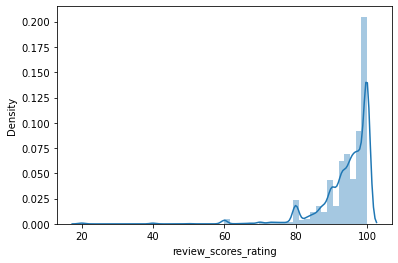

In [7]:
#visualize the distribution of review_scores_rating
import seaborn as sns
sns.distplot(df['review_scores_rating'])

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='bedrooms', ylabel='count'>

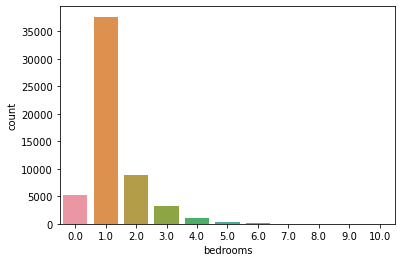

In [8]:
#visualize the distribution of bedrooms
import seaborn as sns
sns.countplot(df['bedrooms'])

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='bathrooms', ylabel='count'>

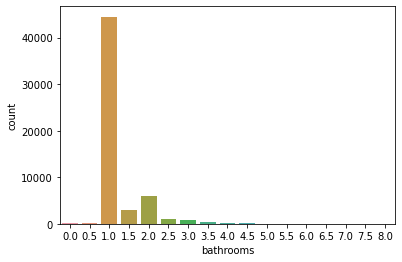

In [9]:
#visualize the distribution of bathrooms
import seaborn as sns
sns.countplot(df['bathrooms'])

D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='number_of_reviews', ylabel='Density'>

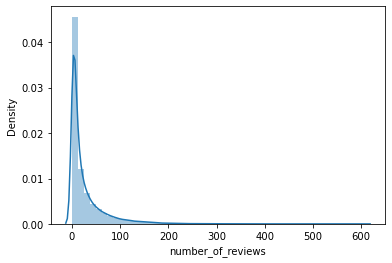

In [10]:
#visualize the distribution of number_of_reviews
import seaborn as sns
sns.distplot(df['number_of_reviews'])

D:\anaconda\lib\site-packages\seaborn\axisgrid.py:1152: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(UserWarning(msg))


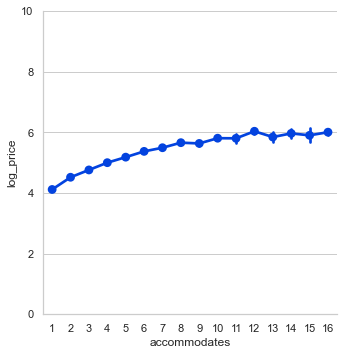

In [11]:
#visualize the relationship between accommodates and log_price
sns.set(style='whitegrid')
g = sns.PairGrid(data=df, x_vars=['accommodates'], y_vars='log_price', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb['blue'])
g.set(ylim=(0,10))

D:\anaconda\lib\site-packages\seaborn\axisgrid.py:1152: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(UserWarning(msg))


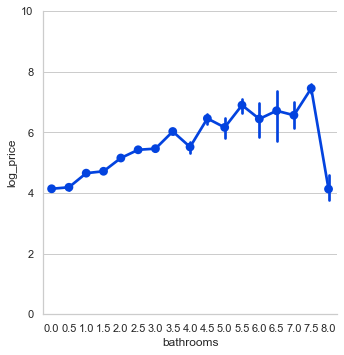

In [12]:
#visualize the relationship between bathrooms and log_price
sns.set(style='whitegrid')
g = sns.PairGrid(data=df, x_vars=['bathrooms'], y_vars='log_price', size=5)
g.map(sns.pointplot, color=sns.xkcd_rgb['blue'])
g.set(ylim=(0,10))

D:\anaconda\lib\site-packages\seaborn\axisgrid.py:1152: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(UserWarning(msg))


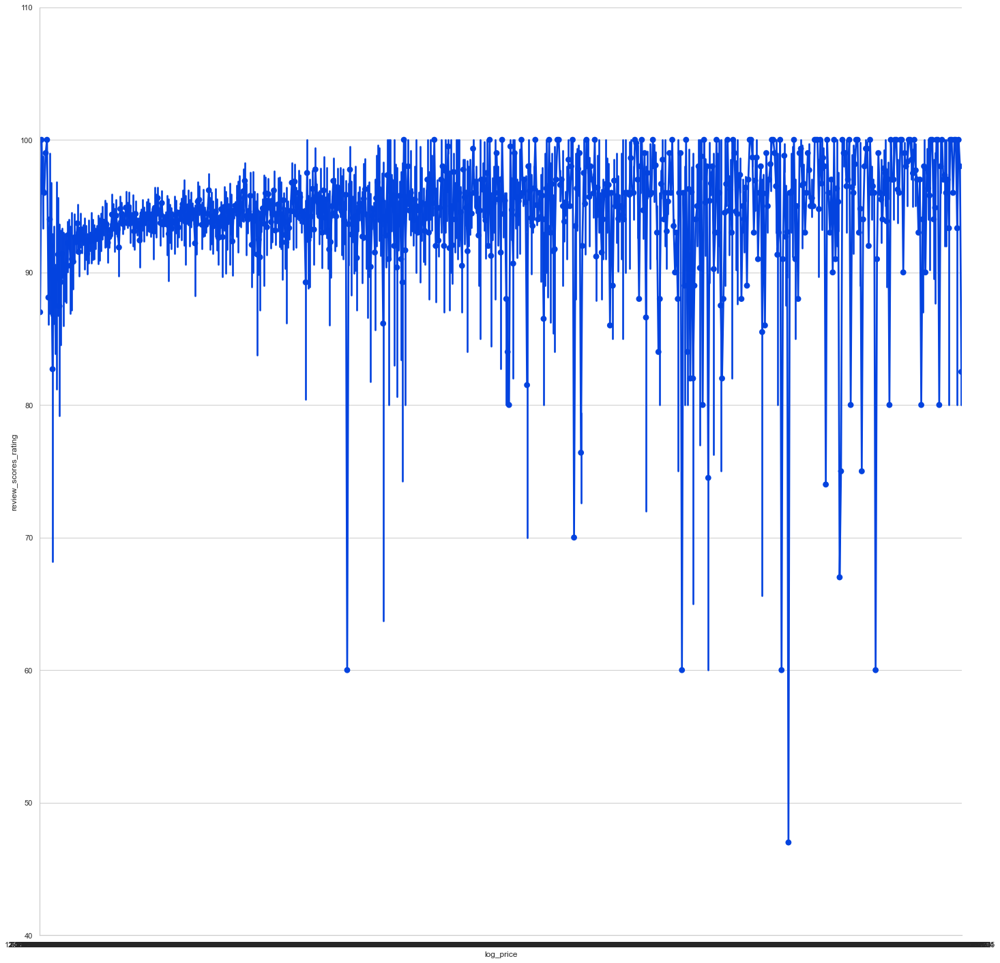

In [13]:
#visualize the relationship between review_scores_rating and log_price
g = sns.PairGrid(data=df, x_vars=['log_price'], y_vars='review_scores_rating', size=20)
g.map(sns.pointplot, color=sns.xkcd_rgb['blue'])
g.set(ylim=(40,110))

### Check missing values

In [14]:
# get the number of missing data points per column
missing_values_count = df.isnull().sum()
# look at the percent of missing points per column
missing_values_count/df.shape[0]*100

id                         0.000000
log_price                  0.000000
property_type              0.000000
room_type                  0.000000
amenities                  0.000000
accommodates               0.000000
bathrooms                  0.280196
bed_type                   0.000000
cancellation_policy        0.000000
cleaning_fee               0.000000
city                       0.000000
description                0.000000
first_review               0.001773
host_has_profile_pic       0.248275
host_identity_verified     0.248275
host_response_rate        16.345387
host_since                 0.248275
instant_bookable           0.000000
last_review                0.001773
latitude                   0.000000
longitude                  0.000000
name                       0.000000
neighbourhood              8.799589
number_of_reviews          0.000000
review_scores_rating       0.000000
thumbnail_url             10.103034
zipcode                    1.170441
bedrooms                   0

### Fill missing values

In [15]:
def fill_na(df):
    df['host_response_rate'] = df['host_response_rate'].str.rstrip('%').astype('float') / 100.0
    df['host_response_rate'] = df['host_response_rate'].interpolate().round(2)


    # df.bathrooms = df.bathrooms.fillna(df.bathrooms.median())
    df['beds'] = df['beds'].interpolate().round(2).astype('int32')
    df['bedrooms'] = df['bedrooms'].interpolate().round(2).astype('int32')
    df['bathrooms'] = df['bathrooms'].interpolate().round(2).astype('int32')

    df.host_response_rate = df.host_response_rate.fillna(0)
    
    return df

In [16]:
df = fill_na(df)

### Check duplicates

In [17]:
duplicate = df.duplicated()
duplicate.sum()

#zero means no duplicated records

0

## Data Preparation 

In [18]:
def preparation(df):
#Drop unused columns 
    df = df.drop([ 'bed_type', 'first_review', 'host_has_profile_pic','latitude','longitude','name',
                  'neighbourhood','thumbnail_url','zipcode'], axis = 1)

    # create dummies for 'property_type'
    df['is_apt'] = df['property_type'].apply(lambda x: 1 if x=='Apartment' else 0)
    df['is_house'] = df['property_type'].apply(lambda x: 1 if x=='House' else 0)
    df['is_other_ppt_type'] = df['property_type'].apply(lambda x: 1 if (x!='Apartment') | (x!='House') else 0)

    # Create dummies for 'room_type'
    df['is_entireRoom'] = df['room_type'].apply(lambda x: 1 if x=='Entire home/apt' else 0)
    df['is_privateRoom'] = df['room_type'].apply(lambda x: 1 if x=='Private room' else 0)
    df['is_sharedRoom'] = df['room_type'].apply(lambda x: 1 if x=='Shared room' else 0)

    # Ordinal variables
    df['is_cancellation_policy'] = df['cancellation_policy'].apply(lambda x: 1 if (x =='strict') |(x =='super_strict_30')|(x =='super_strict_60') 
                                                                else (2 if x=='moderate' else 3))

    # Binary variables
    df['is_cleaning_fee'] = df['cleaning_fee'].apply(lambda x: 1 if x is True else 0)
    df['is_instantBookable'] = df['instant_bookable'].apply(lambda x: 1 if x == 't' else 0)
    df['is_instantBookable'] = df['instant_bookable'].apply(lambda x: 1 if x == 't' else 0)
    df.host_identity_verified = df.host_identity_verified.apply(lambda x: 1 if x=='t' else 0)


    # Change 'city' to categorical 
    df['is_city_nyc'] = df['city'].apply(lambda x: 1 if x=='NYC' else 0)
    df['is_city_la'] = df['city'].apply(lambda x: 1 if x=='LA' else 0)
    df['is_city_sf'] = df['city'].apply(lambda x: 1 if x=='SF' else 0)
    df['is_city_dc'] = df['city'].apply(lambda x: 1 if x=='SF' else 0)
    df['is_city_chicago'] = df['city'].apply(lambda x: 1 if x=='Chicago' else 0)


    df.drop(columns = ['property_type', 'room_type', 'cancellation_policy', 'cleaning_fee', 'instant_bookable', 'instant_bookable', 'city', 'last_review'], axis = 1, inplace = True)
    
    return df

In [19]:
df = preparation(df)

### Feature Engineering

In [20]:
# Create 'host_days'
df['host_since']=pd.to_datetime(df['host_since'], format = "%Y-%m-%d")
today = datetime.datetime.today()
host_days = today-df['host_since']
df['host_days'] = host_days.dt.days
df['host_days'] = df['host_days'].interpolate().round(2).astype('int32')

# Calculate number of beds per bedroom
df.loc[df['bedrooms']==0,'bedrooms'] = 1
df['bath_per_bedrooms'] = df.bathrooms/df.bedrooms          
df['beds_per_person']=df.beds/df.accommodates

df.drop(columns = ['bathrooms','bedrooms','beds','accommodates','host_since'], axis = 1, inplace = True)

In [21]:
# convert to uint for saving storage
df.is_instantBookable = df.is_instantBookable.astype('uint8')

df.host_identity_verified = df.host_identity_verified.astype('uint8')

df.is_apt = df.is_apt.astype('uint8')

df.is_house = df.is_house.astype('uint8')

df.is_other_ppt_type = df.is_other_ppt_type.astype('uint8')

df.is_entireRoom = df.is_entireRoom.astype('uint8')

df.is_privateRoom = df.is_privateRoom.astype('uint8')

df.is_sharedRoom = df.is_sharedRoom.astype('uint8')

df.is_cleaning_fee = df.is_cleaning_fee.astype('uint8')

## Check outliers

Check outliers for host_days

<function matplotlib.pyplot.show(close=None, block=None)>

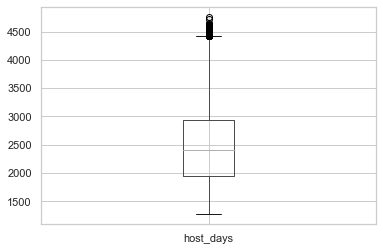

In [22]:
import matplotlib.pyplot as plt

df.boxplot(column=['host_days'])
plt.show

In [23]:
#source: https://www.analyticsvidhya.com/blog/2020/08/exploratory-data-analysiseda-from-scratch-in-python/

#create a function to replace outliers
def remove_outlier(col):
    '''find IQR'''
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range, upper_range

In [24]:
#replace the outliers using IQR
import numpy as np
lowday,uppday=remove_outlier(df['host_days'])
df['host_days']=np.where(df['host_days']>uppday,uppday,df['host_days'])
df['host_days']=np.where(df['host_days']<lowday,lowday,df['host_days'])

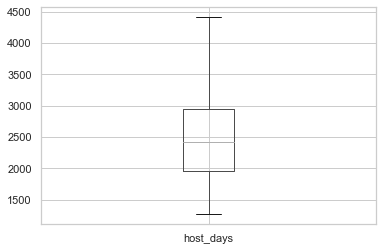

In [25]:
#boxplot after removing outlier
import matplotlib.pyplot as plt
df.boxplot(column=['host_days'])
plt.show()

In [26]:
df.describe()

,id,log_price,host_identity_verified,host_response_rate,number_of_reviews,review_scores_rating,is_apt,is_house,is_other_ppt_type,is_entireRoom,...,is_cleaning_fee,is_instantBookable,is_city_nyc,is_city_la,is_city_sf,is_city_dc,is_city_chicago,host_days,bath_per_bedrooms,beds_per_person
count,5.638900e+04,56389.000000,56389.000000,56389.00000,56389.000000,56389.000000,56389.000000,56389.000000,56389.0,56389.000000,...,56389.000000,56389.000000,56389.000000,56389.000000,56389.000000,56389.000000,56389.000000,56389.000000,56389.000000,56389.000000
mean,1.124892e+07,4.748929,0.726649,0.95561,26.999699,94.056678,0.657806,0.227172,1.0,0.575325,...,0.794020,0.268279,0.435794,0.299934,0.087943,0.087943,0.055773,2474.233804,0.962046,0.582743
std,6.086881e+06,0.669199,0.445684,0.12764,41.134194,7.848424,0.474449,0.419008,0.0,0.494298,...,0.404419,0.443068,0.495865,0.458233,0.283214,0.283214,0.229485,661.405166,0.366961,0.278144
min,3.440000e+02,0.000000,0.000000,0.00000,1.000000,20.000000,0.000000,0.000000,1.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1267.000000,0.000000,0.000000
25%,6.237604e+06,4.304065,0.000000,1.00000,3.000000,92.000000,0.000000,0.000000,1.0,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1953.000000,1.000000,0.500000
50%,1.222316e+07,4.700480,1.000000,1.00000,11.000000,96.000000,1.000000,0.000000,1.0,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2414.000000,1.000000,0.500000
75%,1.639809e+07,5.164786,1.000000,1.00000,33.000000,100.000000,1.000000,0.000000,1.0,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2940.000000,1.000000,0.666667
max,2.123090e+07,7.600402,1.000000,1.00000,605.000000,100.000000,1.000000,1.000000,1.0,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4420.500000,8.000000,16.000000


Create correlation matrix heatmap

In [27]:
#df_vis for visualization, drop columns that are object
df_vis = df.drop(['amenities','description'],axis=1)

<AxesSubplot:>

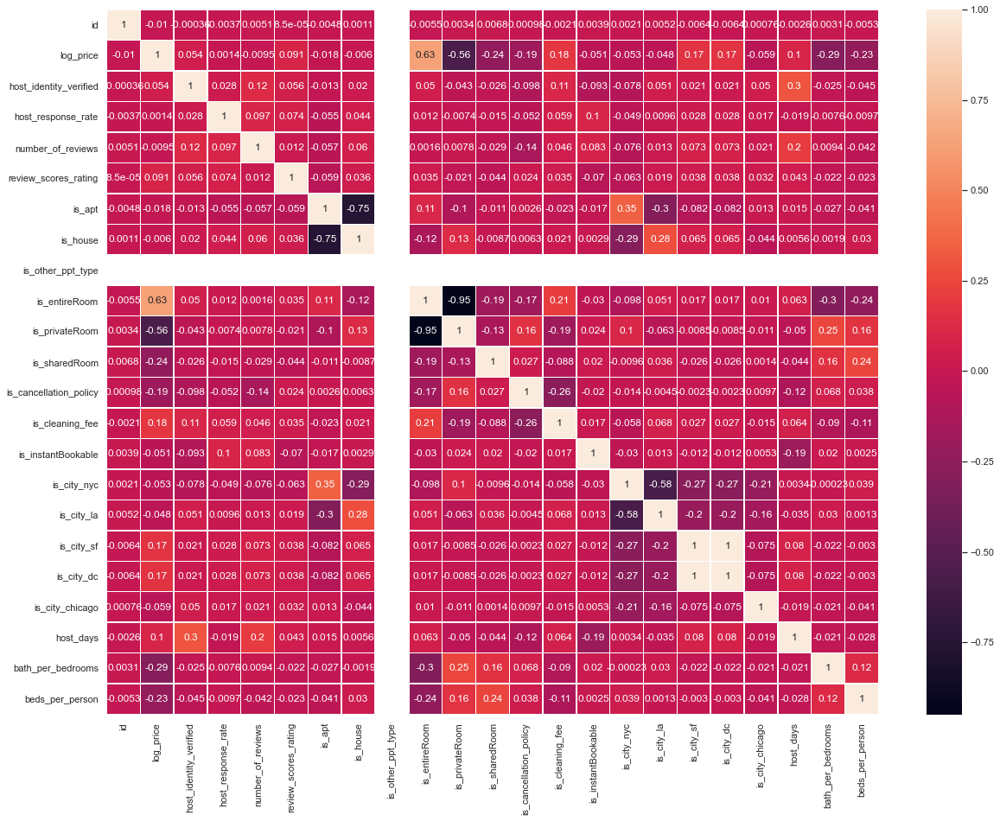

In [28]:
import seaborn as sns

plt.figure(figsize = (20,15))

corr = df_vis.corr() #correlation matrix
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, linewidths=.5)

## PCA 

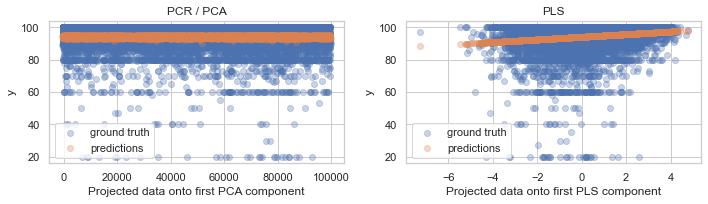

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression

df_pca = df.drop(['amenities','description'],1)
X,y = df_pca.drop('review_scores_rating',1),df_pca['review_scores_rating']

SEED=1
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=SEED)


pcr = make_pipeline(StandardScaler(), PCA(n_components=1), LinearRegression())
pcr.fit(X_train, y_train)
pca = pcr.named_steps['pca']  # retrieve the PCA step of the pipeline

pls = PLSRegression(n_components=1)
pls.fit(X_train, y_train)

fig, axes = plt.subplots(1, 2, figsize=(10, 3))
axes[0].scatter(pca.transform(X_test), y_test, alpha=.3, label='ground truth')
axes[0].scatter(pca.transform(X_test), pcr.predict(X_test), alpha=.3,
                label='predictions')
axes[0].set(xlabel='Projected data onto first PCA component',
            ylabel='y', title='PCR / PCA')
axes[0].legend()
axes[1].scatter(pls.transform(X_test), y_test, alpha=.3, label='ground truth')
axes[1].scatter(pls.transform(X_test), pls.predict(X_test), alpha=.3,
                label='predictions')
axes[1].set(xlabel='Projected data onto first PLS component',
            ylabel='y', title='PLS')
axes[1].legend()
plt.tight_layout()
plt.show()

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56389 entries, 0 to 74110
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      56389 non-null  int64  
 1   log_price               56389 non-null  float64
 2   amenities               56389 non-null  object 
 3   description             56389 non-null  object 
 4   host_identity_verified  56389 non-null  uint8  
 5   host_response_rate      56389 non-null  float64
 6   number_of_reviews       56389 non-null  int64  
 7   review_scores_rating    56389 non-null  float64
 8   is_apt                  56389 non-null  uint8  
 9   is_house                56389 non-null  uint8  
 10  is_other_ppt_type       56389 non-null  uint8  
 11  is_entireRoom           56389 non-null  uint8  
 12  is_privateRoom          56389 non-null  uint8  
 13  is_sharedRoom           56389 non-null  uint8  
 14  is_cancellation_policy  56389 non-null

## TSNE

In [32]:
finaldf = df[['host_identity_verified','host_response_rate','review_scores_rating','is_apt','is_house','is_other_ppt_type',
              'is_entireRoom','is_privateRoom','is_cancellation_policy','is_cleaning_fee','is_instantBookable','is_city_nyc',
              'is_city_la','is_city_sf','is_city_dc','is_city_chicago','host_days','bath_per_bedrooms','beds_per_person']]
finaldf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56389 entries, 0 to 74110
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   host_identity_verified  56389 non-null  uint8  
 1   host_response_rate      56389 non-null  float64
 2   review_scores_rating    56389 non-null  float64
 3   is_apt                  56389 non-null  uint8  
 4   is_house                56389 non-null  uint8  
 5   is_other_ppt_type       56389 non-null  uint8  
 6   is_entireRoom           56389 non-null  uint8  
 7   is_privateRoom          56389 non-null  uint8  
 8   is_cancellation_policy  56389 non-null  int64  
 9   is_cleaning_fee         56389 non-null  uint8  
 10  is_instantBookable      56389 non-null  uint8  
 11  is_city_nyc             56389 non-null  int64  
 12  is_city_la              56389 non-null  int64  
 13  is_city_sf              56389 non-null  int64  
 14  is_city_dc              56389 non-null

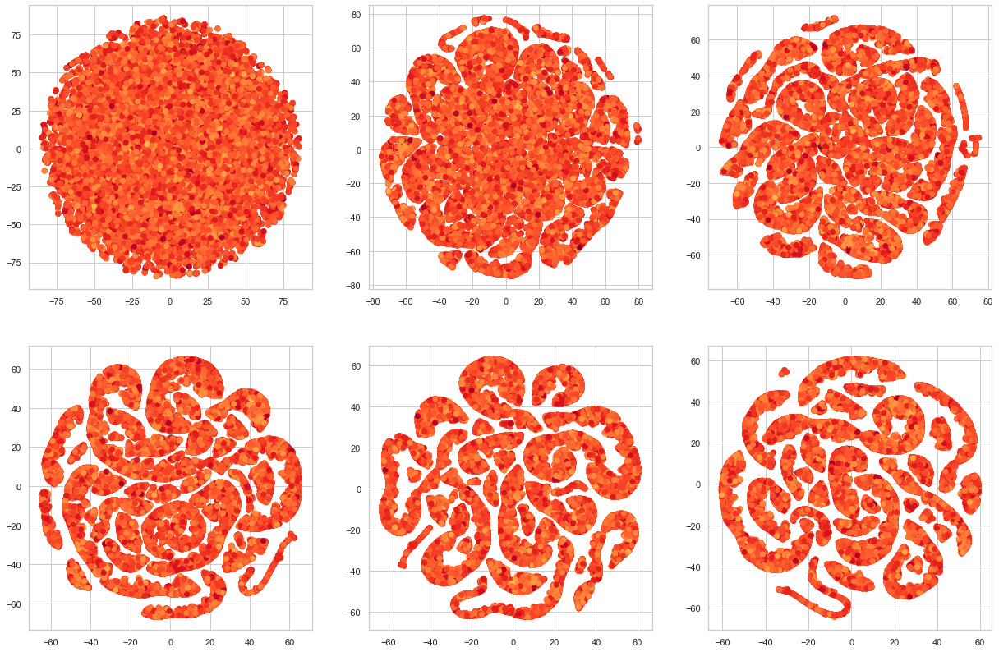

In [33]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
plt.figure(figsize=(21,14))
for i,num in enumerate([5, 20, 40, 60, 80, 100]):
    model=TSNE(learning_rate=200,perplexity=num)
    Tsne_transformed=model.fit_transform(finaldf)
    xs =Tsne_transformed[:,0]
    ys=Tsne_transformed[:,1]
    plt.subplot(2,3,i+1)
    plt.scatter(xs,ys,c=df['log_price'],cmap='YlOrRd')

## PCA and TSNE

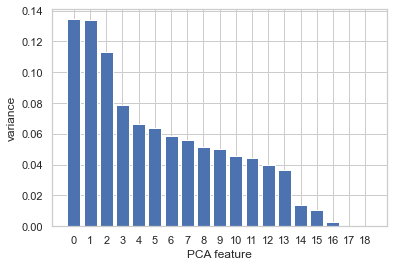

In [34]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt

# Create scaler: scaler
scaler = StandardScaler()

# Create a PCA instance: pca
pca = PCA()

# Create pipeline: pipeline
pipeline = make_pipeline(scaler, pca)

# Fit the pipeline to 'samples'
pipeline.fit(finaldf)

# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_)
plt.xlabel('PCA feature')
plt.ylabel('variance')
plt.xticks(features)
plt.show()

Text(0, 0.5, 'Components')

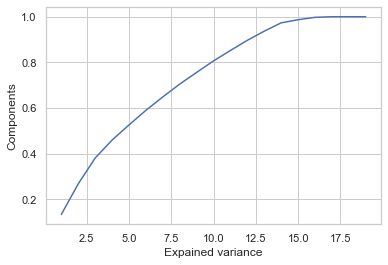

In [35]:
plt.plot(range(1, len(pca.explained_variance_)+1), pca.explained_variance_ratio_.cumsum())
plt.xlabel('Expained variance')
plt.ylabel('Components')

Text(0, 0.5, 'Second Principal Component')

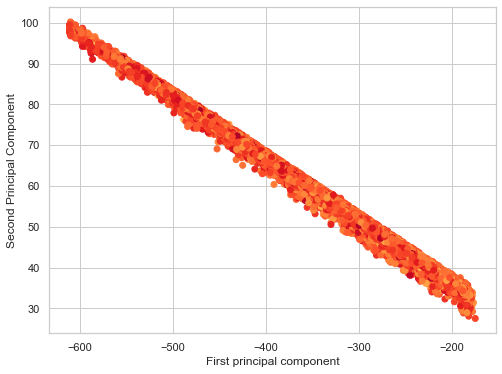

In [36]:
x_pca = pca.transform(finaldf)
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=df['log_price'],cmap='YlOrRd')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [37]:
# Import PCA
from sklearn.decomposition import PCA



stscaler = StandardScaler().fit(finaldf)
scaled_dt = stscaler.transform(finaldf)
# Create a PCA instance with 2 components: pca
pca = PCA(n_components=8)

# Fit the PCA instance to the scaled samples
pca.fit(scaled_dt)

# Transform the scaled samples: pca_features
pca_features = pca.transform(scaled_dt)

# Print the shape of pca_features
print(pca_features.shape)

(56389, 8)


In [38]:
pca_features

array([[-1.12130197, -2.1804558 ,  0.36536382, ...,  3.23409584,
         0.74986583, -2.88007038],
       [-1.00706955, -1.96715217, -0.10795628, ..., -0.02374285,
        -1.03561705, -0.41966801],
       [-0.45744796, -1.66706696,  0.02771135, ..., -0.34670255,
         0.1387853 ,  0.27852875],
       ...,
       [-0.47263465, -0.24398536, -1.02462392, ...,  0.60213742,
         1.10979709,  1.29732672],
       [-1.36413184, -1.72222189,  0.16211413, ..., -0.24871696,
        -0.56141681, -0.04232252],
       [-0.73808062,  0.81614105, -1.30571569, ...,  0.35776242,
         0.23984408,  0.93763393]])

In [39]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
model=TSNE(learning_rate=200, perplexity = 100)
Tsne_transformed=model.fit_transform(pca_features)
Tsne_transformed

array([[ 11.553989  , -19.645893  ],
       [ -7.2927594 , -30.88372   ],
       [ -0.68649244, -41.151833  ],
       ...,
       [-24.137312  , -28.469772  ],
       [  5.0816765 , -47.823563  ],
       [-25.098093  , -14.795298  ]], dtype=float32)

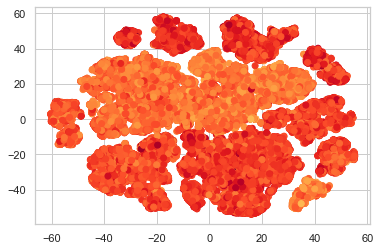

In [40]:
xs =Tsne_transformed[:,0]
ys=Tsne_transformed[:,1]
plt.scatter(xs,ys,c=df['log_price'],cmap='YlOrRd')
plt.show()

## Text Data Engineering

#### Amenities

In [41]:
#!pip install mlxtend

In [42]:
from mlxtend.preprocessing import TransactionEncoder

In [43]:
pd.set_option('display.max_columns', None)

amenities = df.amenities

import regex as re
lt, lst=[],[]
for items in amenities:
    items = items.split(',')
    for item in items:
        item = re.sub(r'["{}]', '', item)
        item = item.strip()
        if item != '':
            lt.append(item)
    lst.append(lt)
    lt=[]
    
te = TransactionEncoder()
te_ary = te.fit(lst).transform(lst)
te_ary.astype("int")

amnt_df=pd.DataFrame(te_ary, columns=te.columns_)
amnt_df = amnt_df.astype(int)

Classify the ammenities and create 17 categories

In [ ]:
for i in amnt_df.columns:
  if i in ['Children’s books and toys', 'Pack ’n Play/travel crib','Family/kid friendly']:
    amnt_df = amnt_df.rename(columns= {i: 'baby_friendly'})
  elif i in ['Garden or backyard','Patio or balcony']:
    amnt_df = amnt_df.rename(columns= {i: 'garden_patio'})
  elif i in ['Coffee maker','Oven','Microwave','Stove','Refrigerator','Dryer','Washer','Iron','Hair dryer']:
    amnt_df = amnt_df.rename(columns= {i: 'household_appliances'})
  elif i in ['Doorman','Lockbox','Private entrance','Safety card','Self Check-In','Lock on bedroom door','Buzzer/wireless intercom','24-hour check-in','First aid kit','Fire extinguisher']:
    amnt_df = amnt_df.rename(columns= {i: 'good_security_system'})
  elif i in ['Extra pillows and blankets','Bed linens']:
    amnt_df = amnt_df.rename(columns= {i: 'bedroom_essentials'})
  elif i in ['Wheelchair accessible']:
    amnt_df = amnt_df.rename(columns= {i: 'Wheelchair_accessible'})
  elif i in ['Keypad','Laptop friendly workspace','Internet']:
    amnt_df = amnt_df.rename(columns= {i: 'good_working_environment'})
  elif i in ['Dishwasher','Cooking basics','Hot water','Dishes and silverware']:
    amnt_df = amnt_df.rename(columns= {i: 'kitchen_essentials'})
  elif i in ['Cat(s)','Dog(s)','Pets allowed','Pets live on this property']:
    amnt_df = amnt_df.rename(columns= {i: 'pets_allowed'})
  elif i in ['Pool','Gym']:
    amnt_df = amnt_df.rename(columns= {i: 'gym_pool'})
  elif i in ['Elevator in building','Elevator']:
    amnt_df = amnt_df.rename(columns= {i: 'elevator'})
  elif i in ['Bathtub','Hot tub', 'Shampoo']:
    amnt_df = amnt_df.rename(columns= {i: 'bathroom_essentials'})
  elif i in ['Breakfast']:
    amnt_df = amnt_df.rename(columns= {i: 'breakfast'})
  elif i in ['Indoor fireplace']:
    amnt_df = amnt_df.rename(columns= {i: 'fireplace'})
  elif i in['Free parking on premises']:
    amnt_df = amnt_df.rename(columns= {i: 'free_parking'})
  elif i in ['Hangers']:
    amnt_df = amnt_df.rename(columns= {i: 'hangers'})
  elif i in ['Air conditioning']:
    amnt_df = amnt_df.rename(columns= {i: 'air_conditioning'})

    
amnt_df = amnt_df.groupby(level=0, axis=1).sum()
amnt_df = pd.DataFrame(np.where(amnt_df>=1, 1, 0), columns=amnt_df.columns)
amnt_df = amnt_df[['baby_friendly','garden_patio','household_appliances','good_security_system',
                   'bedroom_essentials','Wheelchair_accessible','good_working_environment','kitchen_essentials',
                   'pets_allowed','gym_pool','elevator','bathroom_essentials','breakfast','fireplace',
                   'free_parking','hangers','air_conditioning']]

In [ ]:
df.reset_index(inplace = True, drop=True)
df = pd.concat([df, amnt_df], axis=1)

In [ ]:
df = df.drop(['id', 'amenities'],axis=1)
df.head()

,log_price,description,host_identity_verified,host_response_rate,number_of_reviews,review_scores_rating,is_apt,is_house,is_other_ppt_type,is_entireRoom,is_privateRoom,is_sharedRoom,is_cancellation_policy,is_cleaning_fee,is_instantBookable,is_city_nyc,is_city_la,is_city_sf,is_city_dc,is_city_chicago,host_days,bath_per_bedrooms,beds_per_person,baby_friendly,garden_patio,household_appliances,good_security_system,bedroom_essentials,Wheelchair_accessible,good_working_environment,kitchen_essentials,pets_allowed,gym_pool,elevator,bathroom_essentials,breakfast,fireplace,free_parking,hangers,air_conditioning
0,5.010635,"Beautiful, sunlit brownstone 1-bedroom in the ...",1,0.0,2,100.0,1,0,1,1,0,0,1,1,0,1,0,0,0,0,3278,1.000000,0.333333,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,5.129899,Enjoy travelling during your stay in Manhattan...,0,1.0,6,93.0,1,0,1,1,0,0,1,1,1,1,0,0,0,0,1367,0.333333,0.428571,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,1
2,4.976734,The Oasis comes complete with a full backyard ...,1,1.0,10,92.0,1,0,1,1,0,0,2,1,1,1,0,0,0,0,1604,1.000000,0.600000,1,0,1,1,0,0,1,0,0,0,0,1,1,0,0,1,1
3,4.744932,"Cool, cozy, and comfortable studio located in ...",1,1.0,4,40.0,1,0,1,1,0,0,2,1,1,0,0,0,0,0,2208,1.000000,0.500000,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1
4,4.442651,Beautiful private room overlooking scenic view...,1,1.0,3,100.0,1,0,1,0,1,0,1,1,1,0,0,1,1,0,1379,1.000000,0.500000,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0


In [ ]:
# df = df.drop(['description'],axis=1)

In [ ]:
# df.to_csv('data2.1.csv')

#### Description

In [ ]:
!pip install nltk
!pip install top2vec
!pip install tensorflow tensorflow_hub tensorflow_text
!pip install pyLDAvis
!pip install wordcloud

  Using cached https://files.pythonhosted.org/packages/70/8a/064b4077e3d793f877e3b77aa64f56fa49a4d37236a53f78ee28be009a16/numpy-1.20.1-cp37-cp37m-manylinux2010_x86_64.whl
ERROR: tensorflow 2.4.1 has requirement numpy~=1.19.2, but you'll have numpy 1.20.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5


  Using cached https://files.pythonhosted.org/packages/08/d6/a6aaa29fea945bc6c61d11f6e0697b325ff7446de5ffd62c2fa02f627048/numpy-1.19.5-cp37-cp37m-manylinux2010_x86_64.whl
ERROR: top2vec 1.0.23 has requirement numpy>=1.20.0, but you'll have numpy 1.19.5 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.20.1
    Uninstalling numpy-1.20.1:
      Successfully uninstalled numpy-1.20.1


In [ ]:
import pandas as pd
import numpy as np
from glob import glob
import re
import string
# import funcy as fp
from gensim import models
from gensim.corpora import Dictionary, MmCorpus
import nltk
from nltk.corpus import stopwords
# from IPython.core.debugger import set_trace
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import pyLDAvis
import pyLDAvis.gensim
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.pipeline import make_pipeline
import json
import os
from top2vec import Top2Vec
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
des = df.description

In [ ]:
nltk.download('wordnet')
stop = set(stopwords.words('english'))

# Let's create a function to pull out nouns from a string of text
from nltk import word_tokenize, pos_tag

def process(text):
    """tokenization"""
    text = text.lower()
    text_filt = re.findall(r'\b[a-zA-Z]{3,}\b', text)

    is_noun_adj = lambda pos: pos[:2] == 'NN' or pos[:2] == 'JJ'

    wordnet_lemmatizer = WordNetLemmatizer()
    text_filt_le = [wordnet_lemmatizer.lemmatize(i) for i in text_filt]
    words_filt = [w for w in text_filt_le if w not in stop]
    nouns_adj = [word for (word, pos) in pos_tag(words_filt) if is_noun_adj(pos)] 
    return nouns_adj

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
des_df = pd.DataFrame()
des_df['description'] = des
des_df['tokens'] = des_df['description'].apply(process)

##### Top2Vec

In [ ]:
tokens_ = [' '.join(i) for i in des_df.tokens]
model = Top2Vec(documents=tokens_, speed = "fast-learn", workers=32, embedding_model='universal-sentence-encoder')
n = model.get_num_topics()
print('Number of Topics generated from Top2Vec: ', n)

2021-03-17 07:09:59,038 - top2vec - INFO - Pre-processing documents for training
2021-03-17 07:10:11,840 - top2vec - INFO - Downloading universal-sentence-encoder model
2021-03-17 07:10:41,937 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2021-03-17 07:11:00,412 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2021-03-17 07:12:40,765 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2021-03-17 07:12:49,834 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Number of Topics generated from Top2Vec:  15


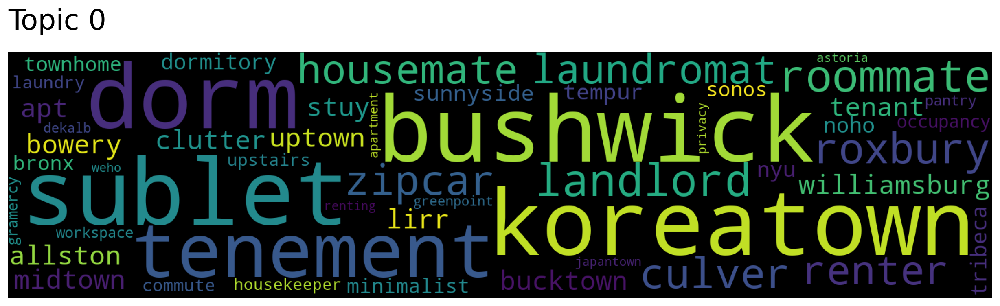

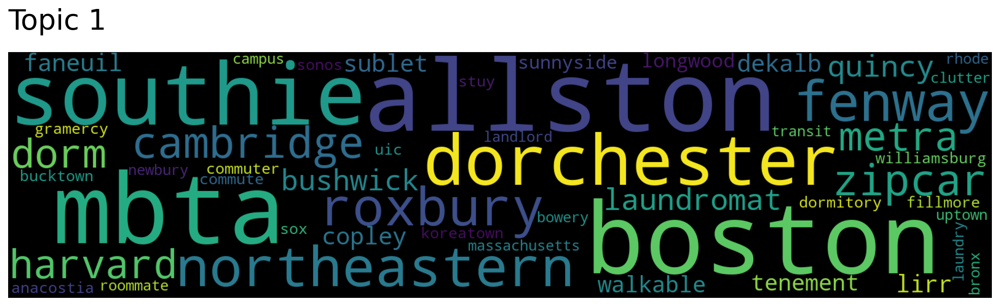

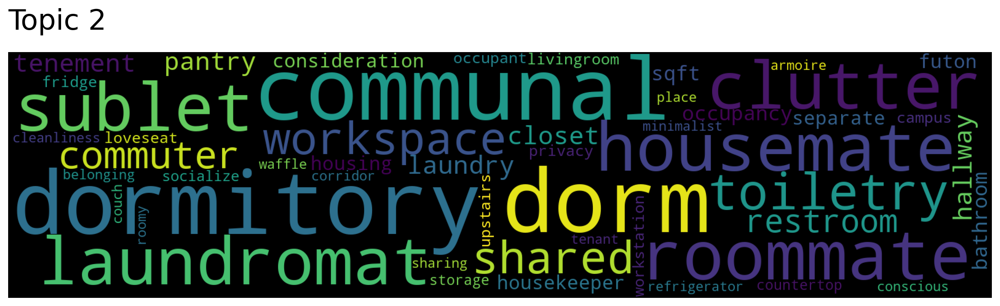

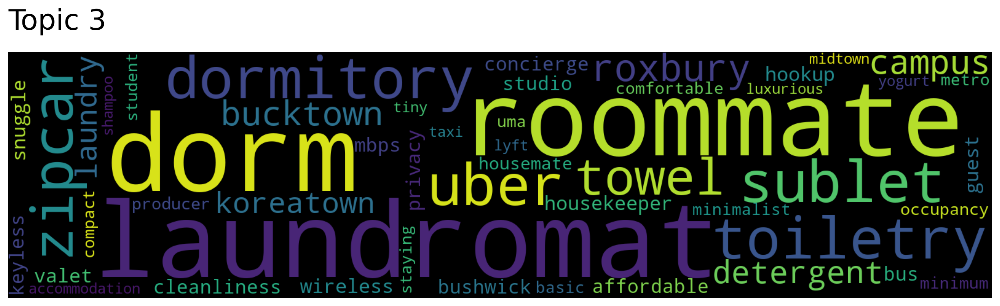

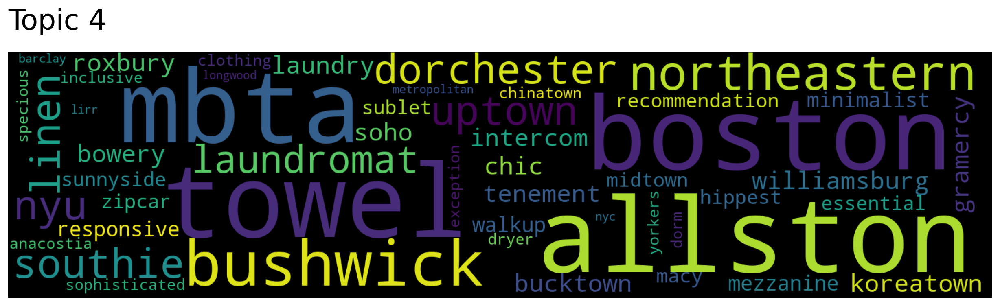

...

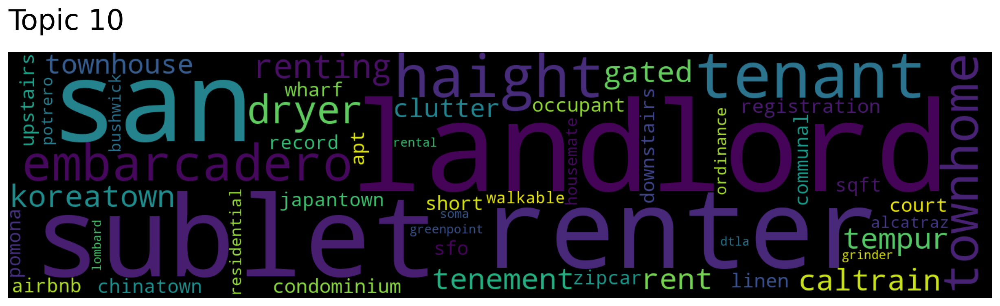

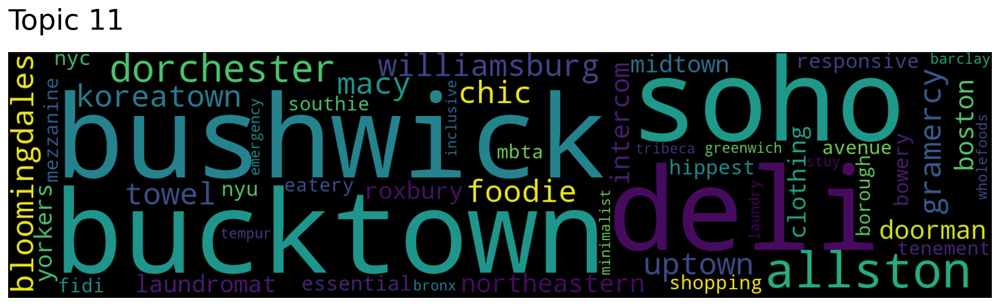

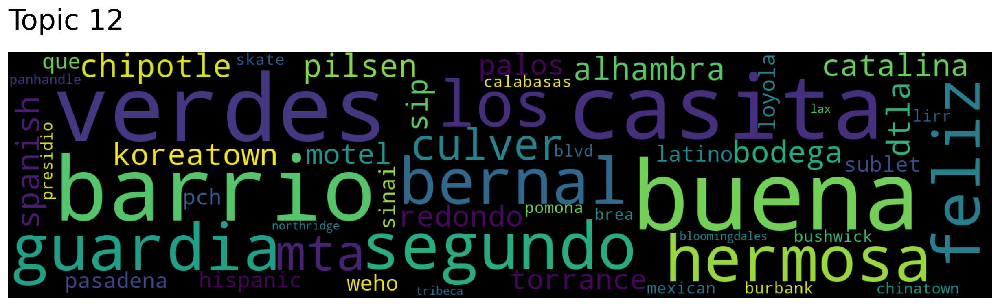

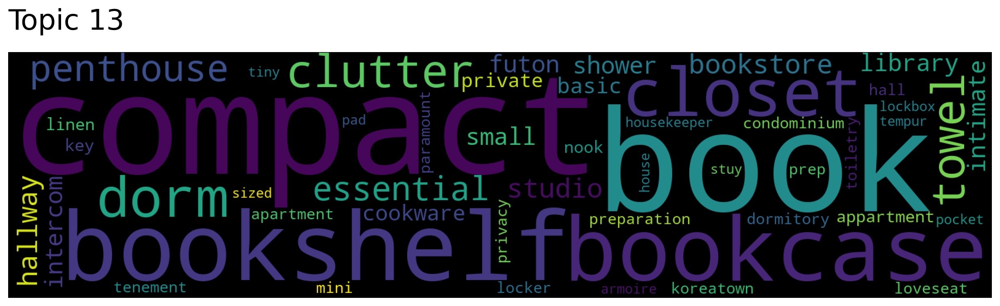

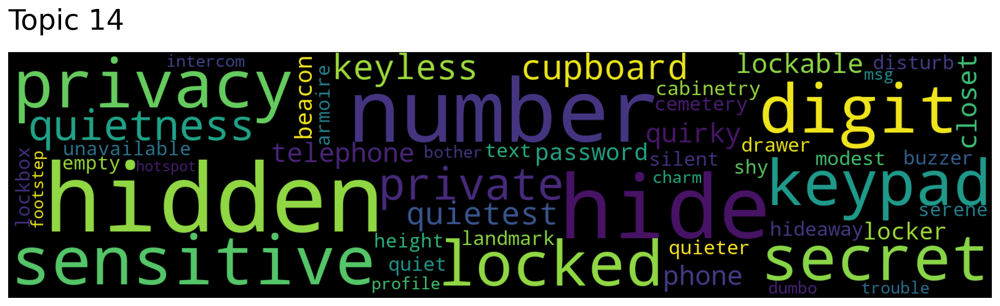

In [ ]:
topic_words, word_scores, topic_nums = model.get_topics(n)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

In [ ]:
# get topics
topic_words, word_scores, topic_nums = model.get_topics(n) #n
print(topic_words)

# topic_words: For each topic the top 50 words are returned, in order of semantic similarity to topic.
# word_scores: For each topic the cosine similarity scores of the top 50 words to the topic are returned.
# topic_nums: The unique index of every topic will be returned.

[['sublet' 'bushwick' 'koreatown' 'dorm' 'tenement' 'landlord' 'roommate'
  'roxbury' 'zipcar' 'culver' 'laundromat' 'renter' 'housemate'
  'williamsburg' 'bucktown' 'allston' 'midtown' 'tenant' 'stuy' 'bowery'
  'apt' 'clutter' 'lirr' 'uptown' 'sunnyside' 'tempur' 'dormitory'
  'tribeca' 'noho' 'nyu' 'minimalist' 'bronx' 'sonos' 'townhome'
  'occupancy' 'upstairs' 'laundry' 'commute' 'housekeeper' 'workspace'
  'pantry' 'gramercy' 'greenpoint' 'dekalb' 'japantown' 'renting'
  'privacy' 'apartment' 'weho' 'astoria']
 ['allston' 'boston' 'mbta' 'southie' 'dorchester' 'northeastern'
  'fenway' 'roxbury' 'cambridge' 'zipcar' 'harvard' 'dorm' 'metra'
  'laundromat' 'quincy' 'bushwick' 'copley' 'faneuil' 'sublet' 'lirr'
  'dekalb' 'tenement' 'walkable' 'longwood' 'sunnyside' 'williamsburg'
  'bucktown' 'dormitory' 'fillmore' 'commuter' 'sox' 'koreatown' 'sonos'
  'gramercy' 'anacostia' 'stuy' 'commute' 'uic' 'massachusetts' 'newbury'
  'bowery' 'transit' 'bronx' 'uptown' 'roommate' 'rhode' 

##### LDA

In [ ]:
def nltk_stopwords():
    return set(nltk.corpus.stopwords.words('english'))

def prep_corpus(docs, additional_stopwords=set(), no_below=3, no_above=0.5):
    """remove stopwords, prepare a reasonable corpus"""
    print('Building dictionary...')
    dictionary = Dictionary(docs)
    stopwords = nltk_stopwords().union(additional_stopwords)
    stopword_ids = map(dictionary.token2id.get, stopwords)
    dictionary.filter_tokens(stopword_ids)      #remove stopwords
    dictionary.compactify()     #remove gaps after words are removed
    dictionary.filter_extremes(no_below=no_below, no_above=no_above, keep_n=None) #keep the words neither too rare nor too frequent
    print(dictionary)
    dictionary.compactify()

    print('Building corpus...')
    corpus = [dictionary.doc2bow(doc) for doc in docs]
    #Convert document into the bag-of-words (BoW) format = list of (token_id, token_count) tuples

    return dictionary, corpus

In [ ]:
dictionary, corpus = prep_corpus(des_df.tokens)

lda_model = models.ldamodel.LdaModel(corpus=corpus,
         id2word=dictionary,
         num_topics=14,
         passes=10,
         random_state=np.random.RandomState(15))
# num_topics=10,eval_every=10,passes=50,iterations=5000
print(lda_model.print_topics())

Building dictionary...
Dictionary(13148 unique tokens: ['beautiful', 'block', 'bridge', 'brooklyn', 'brownstone']...)
Building corpus...


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

[(0, '0.159*"place" + 0.073*"business" + 0.069*"couple" + 0.062*"good" + 0.057*"traveler" + 0.055*"solo" + 0.049*"adventurer" + 0.036*"close" + 0.035*"family" + 0.019*"location"'), (1, '0.048*"apartment" + 0.031*"restaurant" + 0.025*"bar" + 0.023*"great" + 0.019*"neighborhood" + 0.013*"city" + 0.013*"place" + 0.013*"street" + 0.013*"shop" + 0.012*"village"'), (2, '0.030*"home" + 0.019*"garden" + 0.016*"beautiful" + 0.013*"house" + 0.013*"tree" + 0.012*"historic" + 0.012*"light" + 0.011*"art" + 0.011*"old" + 0.010*"neighborhood"'), (3, '0.055*"hollywood" + 0.025*"studio" + 0.025*"los" + 0.022*"pool" + 0.020*"angeles" + 0.017*"distance" + 0.017*"hill" + 0.014*"walk" + 0.014*"center" + 0.013*"restaurant"'), (4, '0.032*"guest" + 0.024*"please" + 0.023*"home" + 0.017*"available" + 0.017*"stay" + 0.014*"time" + 0.014*"space" + 0.012*"day" + 0.010*"free" + 0.010*"check"'), (5, '0.030*"metro" + 0.026*"line" + 0.023*"street" + 0.022*"block" + 0.020*"park" + 0.018*"minute" + 0.018*"station" + 0.

In [ ]:
lda_vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_vis)

##### WordCloud

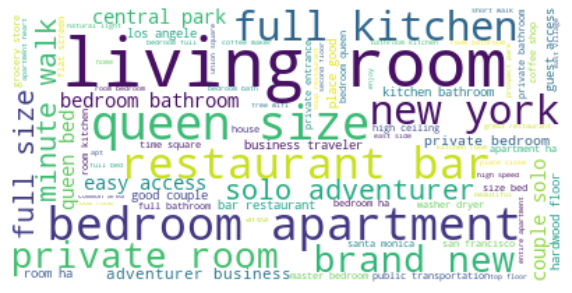

In [ ]:
lst = [' '.join(i) for i in des_df.tokens]
x = re.sub("[^a-zA-Z]",  " ", str(lst))

wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(x)
plt.figure(figsize=(10,8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

##### Truncated SVD

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer 
tfidf = TfidfVectorizer(preprocessor=' '.join, stop_words='english')
tfidf_score = tfidf.fit_transform(des_df.tokens)
print(tfidf_score.toarray())
# Get the words: words
words = tfidf.get_feature_names()
# print(words)

In [ ]:
# #Let's select the optimum number of clusters for k-means classification
# wcss = []

# svd = TruncatedSVD(n_components=50)
# svd_model = svd.fit_transform(tfidf_score)
# for i in range(1, 20):
    
#     kmeans = KMeans(n_clusters = i, init = 'k-means++',
#                     max_iter = 400, n_init = 10, random_state = 0)
#     # pipeline = make_pipeline(svd, kmeans)
#     kmeans.fit(tfidf_score)
#     wcss.append(kmeans.inertia_)
    
# #Plotting the results onto a line graph to observe 'The elbow'
# plt.plot(range(1, 11), wcss)
# plt.title('Elbow Method')
# plt.xlabel('Association')
# plt.ylabel('WCSS') #within cluster sum of squares
# plt.show()

In [ ]:
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.pipeline import make_pipeline

svd = TruncatedSVD(n_components=50)
kmeans = KMeans(n_clusters=n) #14
pipeline = make_pipeline(svd, kmeans)


pipeline.fit(tfidf_score)

labels = pipeline.predict(tfidf_score)
print('Number of Topics generated from TruncatedSVD and KMeans', len(labels))

# Create a DataFrame aligning labels and titles
df_topics = pd.DataFrame({'Group': labels})


In [ ]:
# concate df_topics with df